In [1]:
import pandas as pd
import numpy as np
from cmdstanpy import CmdStanModel
import arviz as az

# Plotting
import matplotlib.pyplot as plt
import seaborn as sns

# You may import additional libraries if needed

# Aesthetics
sns.set_theme(style="whitegrid")
plt.rc('axes', titlesize=10, labelsize=9)
plt.rc('xtick', labelsize=8)
plt.rc('ytick', labelsize=8)

In [2]:
africa = pd.read_csv('https://raw.githubusercontent.com/MLGlobalHealth/StatML4PopHealth/refs/heads/main/data/africa_who_life_expectancy.csv')
africa.head(10)

,Country,Region,Year,Infant_deaths,Under_five_deaths,Adult_mortality,Alcohol_consumption,Hepatitis_B,Measles,BMI,...,Diphtheria,Incidents_HIV,GDP_per_capita,Population_mln,Thinness_ten_nineteen_years,Thinness_five_nine_years,Schooling,Economy_status_Developed,Economy_status_Developing,Life_expectancy
0,Comoros,East Africa,2007,66.8,91.9,255.8815,0.15,75,64,23.5,...,75,0.02,1166,0.64,7.3,7.2,3.5,0,1,60.7
1,Gabon,Central Africa,2012,39.1,57.1,256.8800,7.47,82,64,24.9,...,82,1.57,7181,1.75,6.3,6.2,7.8,0,1,62.9
2,Ghana,West Africa,2011,45.2,65.9,257.0865,1.67,91,58,23.7,...,91,0.93,1580,25.39,6.9,6.8,6.8,0,1,61.4
3,"Congo, Rep.",Central Africa,2003,64.6,100.2,406.7020,0.90,71,64,22.3,...,50,2.23,2072,3.41,9.1,8.8,5.7,0,1,53.8
4,Madagascar,Southern Africa,2011,45.8,67.0,237.6755,0.89,73,64,21.1,...,73,0.15,464,21.74,7.5,7.4,6.1,0,1,63.8
5,Cameroon,Central Africa,2015,57.0,88.0,340.1265,4.55,84,64,24.3,...,84,1.12,1383,23.30,5.6,5.5,6.1,0,1,57.6
6,Zimbabwe,Southern Africa,2009,54.0,91.3,551.9115,2.77,73,64,23.6,...,73,7.31,941,12.53,7.5,7.4,7.2,0,1,48.4
7,South Africa,Southern Africa,2006,48.7,79.2,515.7180,7.30,83,53,26.6,...,82,11.13,5827,48.49,1.6,12.8,9.0,0,1,53.8
8,Eritrea,East Africa,2012,36.8,51.2,274.0290,1.03,94,88,20.6,...,94,0.18,699,3.28,8.7,8.6,3.9,0,1,63.2
9,Seychelles,East Africa,2011,12.2,14.2,154.4505,7.83,99,99,26.3,...,99,3.50,13664,0.09,5.7,6.1,8.4,0,1,72.7


# Final Assessment

In this final assessment, you are tasked with investigating the relationship between various population health indicators and life expectancy to inform government policy decisions on resource allocation and public health priorities. Employing Bayesian statistical methods, your objective is to conduct a rigorous analysis of the World Health Organization (WHO) life expectancy dataset, interpret the results within the context of existing literature, and propose evidence-based recommendations for policy improvements.

## Submission
- You should submit a Jupyter notebook (`.ipynb` file) containing your analysis, code, and results.
- You should submit any `.stan` file you use for the analysis.
- You should include visualizations, tables, and other relevant outputs to support your analysis.
- The notebook should be well-organized, with clear explanations and interpretations of the results.

## Dataset
TODO: include URL of dataset

The dataset is an updated subset of the WHO life expectancy dataset, specifically focused on the African continent. It comprises data from 51 countries covering the period from 2000 to 2015, with a total of 816 observations and 21 variables. The dataset includes a broad spectrum of indicators, ranging from health and immunization measures to economic and demographic factors. The variables are defined as follows:

- Country: Name of the country
- Region: Geographical region within Africa
- Year: Year of observation
- Infant_deaths: Number of infant deaths per 1000 population
- Under_five_deaths: Number of deaths among children under five per 1000 population
- Adult_mortality: Number of adult deaths per 1000 population
- Alcohol_consumption: Per capita alcohol consumption (liters for individuals aged 15 and older)
- Hepatitis_B: Immunization coverage against Hepatitis B among 1-year-olds (%)
- Measles: Immunization coverage against measles among 1-year-olds (%)
- BMI: Average Body Mass Index of the population
- Polio: Polio immunization coverage among 1-year-olds (%)
- Diphtheria: Coverage for DTP3 (Diphtheria, Tetanus, Pertussis) immunization among 1-year-olds (%)
- Incidents_HIV: Incidence of HIV per 1000 population (ages 15-49)
- GDP_per_capita: Gross Domestic Product per capita (in USD)
- Population_mln: Population size in millions
- Thinness_ten_nineteen_years: Prevalence of thinness among adolescents (ages 10-19, %)
- Thinness_five_nine_years: Prevalence of thinness among children (ages 5-9, %)
- Schooling: Average years of schooling for individuals aged 25 or older
- Economy_status_Developed: Indicator variable for developed country status
- Economy_status_Developing: Indicator variable for developing country status
- Life_expectancy: Average life expectancy (in years)

## Scoring scheme
- Exploratory Data Analysis (EDA) (20 points)
    - Appropriate methodology for answering the research question and building the model
    - Quality of the figures and interpretation
- Bayesian Linear Regression (30 points)
    - Correct mathematical expression of the model
    - Correct implementation of the model in Stan
    - Necessary model diagnositics
    - Summarization, visualization, and interpretation of the results
- Interpretation of Results (10 points)
    - Interpretation of the results in the context of the research question
    - Comparison of the results with other sources of information
- Recommendations (10 points)
    - Recommendations are clear and supported by the analysis
- Extra Credit (30 points)
    - Attempts to improve the model

Note on code: You will not be judged on the quality of the code, but it should be clear and well-commented, otherwise we make take points off for not being able to understand your analysis.

## 1. Exploratory Data Analysis (EDA)

### 1.1 Temporal Analysis of Life Expectancy

Initiate your analysis by examining the temporal evolution of life expectancy across countries. Construct time series plots for each country to assess the progression of life expectancy over time. Scrutinize these visualizations for overarching trends and notable deviations. Identify any countries that exhibit anomalous patterns and consider potential explanatory factors, such as socioeconomic disparities, healthcare policies, or regional environmental influences.

Given the considerable number of countries within the dataset, it may be necessary to create multiple plots by grouping countries according to their respective regions. You do not have the time to present a detailed discussion for each country, so you should focus on 3 to 5 countries that are representative, have distinct trends, or unique characteristics. You may choose countries that you are familiar with as domain knowledge can provide valuable insights into the underlying dynamics.

In [4]:
africa.Region.unique()

array(['East Africa', 'Central Africa', 'West Africa', 'Southern Africa',
       'North Africa'], dtype=object)

In [3]:
east = africa[africa.Region == 'East Africa']
west = africa[africa.Region == 'West Africa']
north = africa[africa.Region == 'North Africa']
south = africa[africa.Region == 'Southern Africa']
central = africa[africa.Region == 'Central Africa']

import matplotlib.lines as lines

Text(0.5, 0.98, 'East Africa Life Expectancy')

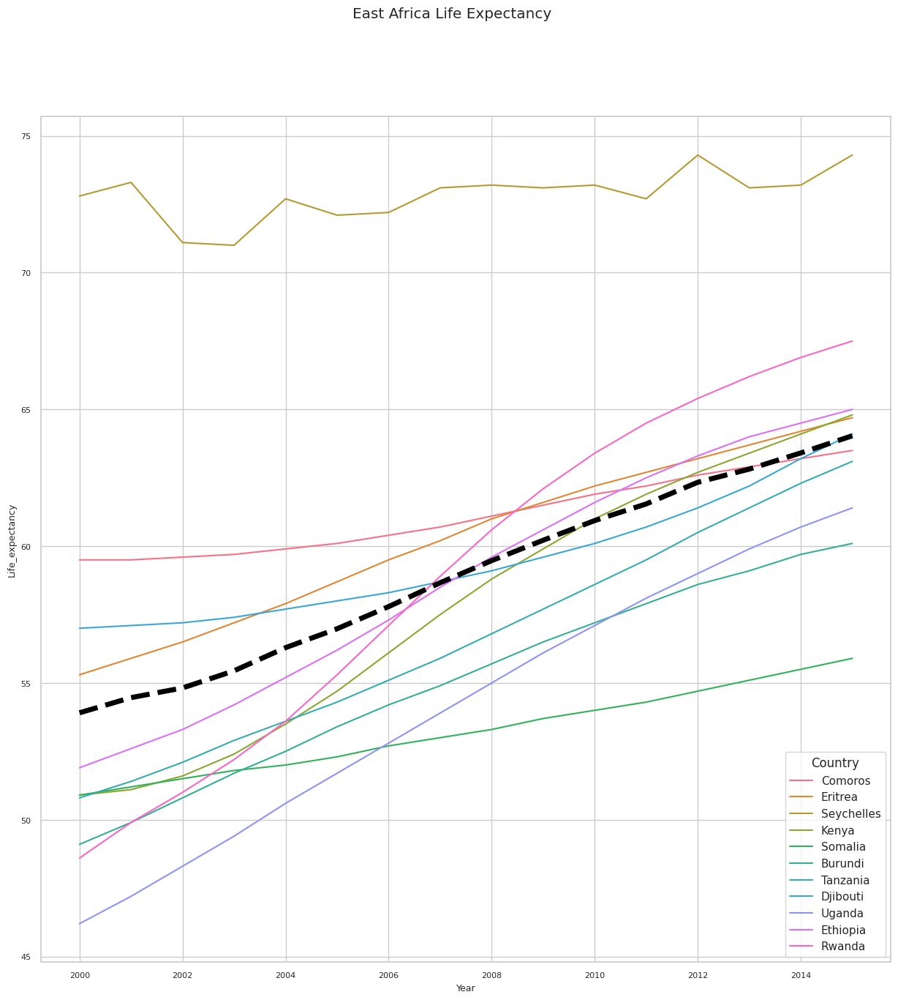

In [75]:
# counter = 0
# fig, axs = plt.subplots(6,10,layout='constrained')
# fig.align_ylabels(axs[:, 1])
# fig.align_xlabels(axs[1, :])
# fig.set_size_inches(15, 15)
# fig.suptitle('Country Life Expectancy')
# for i in range(0,len(axs)):
#   #print(axs[i])
#   for j in range(0,len(axs[i])):
#     counter += 1
#     country = counter
#     axs[i][j].plot(africa[africa.Country == africa.Country[country]].Year, africa[africa.Country == africa.Country[country]].Life_expectancy)
#     axs[i][j].set_title(africa.Country[country])
# View the sites
fig, ax = plt.subplots(figsize=(15, 15))
e = sns.lineplot(east,  x='Year', y='Life_expectancy', hue='Country')
avg_east = east.groupby('Year')['Life_expectancy'].mean()
line = lines.Line2D(avg_east.index, avg_east, linestyle='--',
                    lw=5, color='black', axes=ax)
ax.add_line(line)
fig.suptitle('East Africa Life Expectancy')
#ax.legend(fontsize='xx-small')

#regional_averages = africa.groupby(['Region', 'Year'])['Life_expectancy'].mean().reset_index()



Text(0.5, 0.98, 'West Africa Life Expectancy')

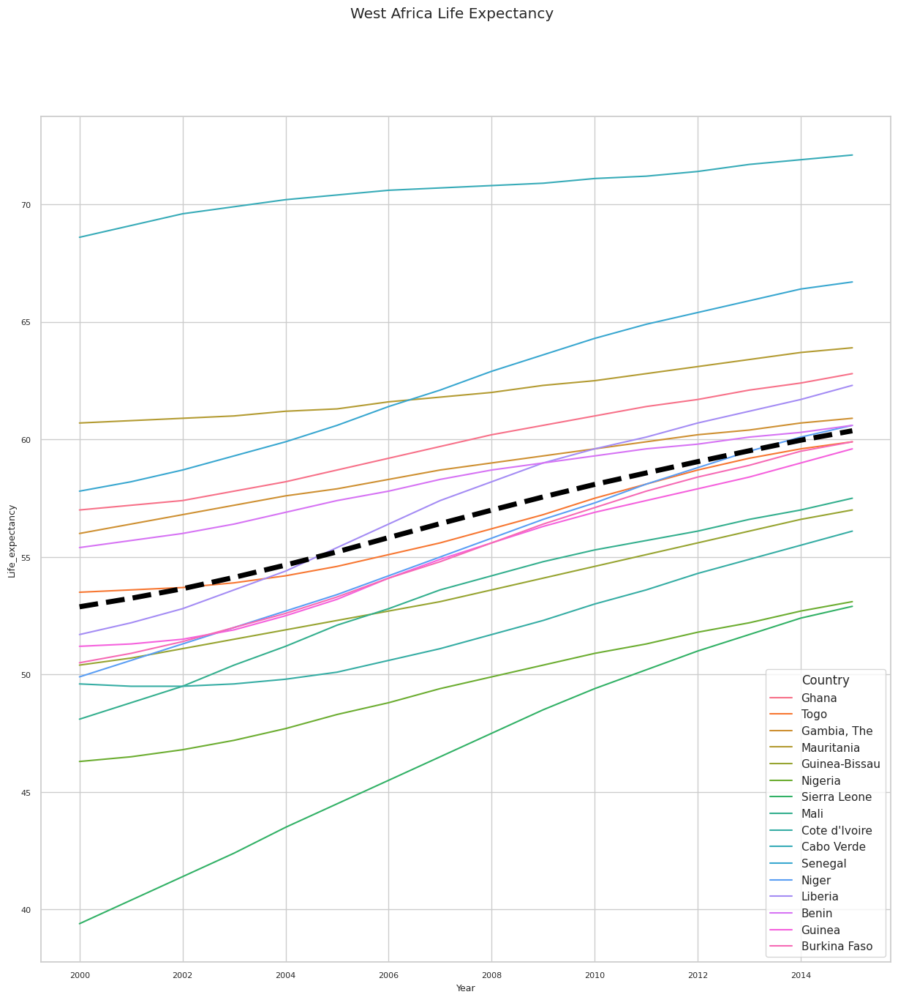

In [76]:
fig, ax = plt.subplots(figsize=(15, 15))
w = sns.lineplot(west,  x='Year', y='Life_expectancy', hue='Country')
avg_west = west.groupby('Year')['Life_expectancy'].mean()
line = lines.Line2D(avg_west.index, avg_west, linestyle='--',
                    lw=5, color='black', axes=ax)
ax.add_line(line)
fig.suptitle('West Africa Life Expectancy')

Text(0.5, 0.98, 'North Africa Life Expectancy')

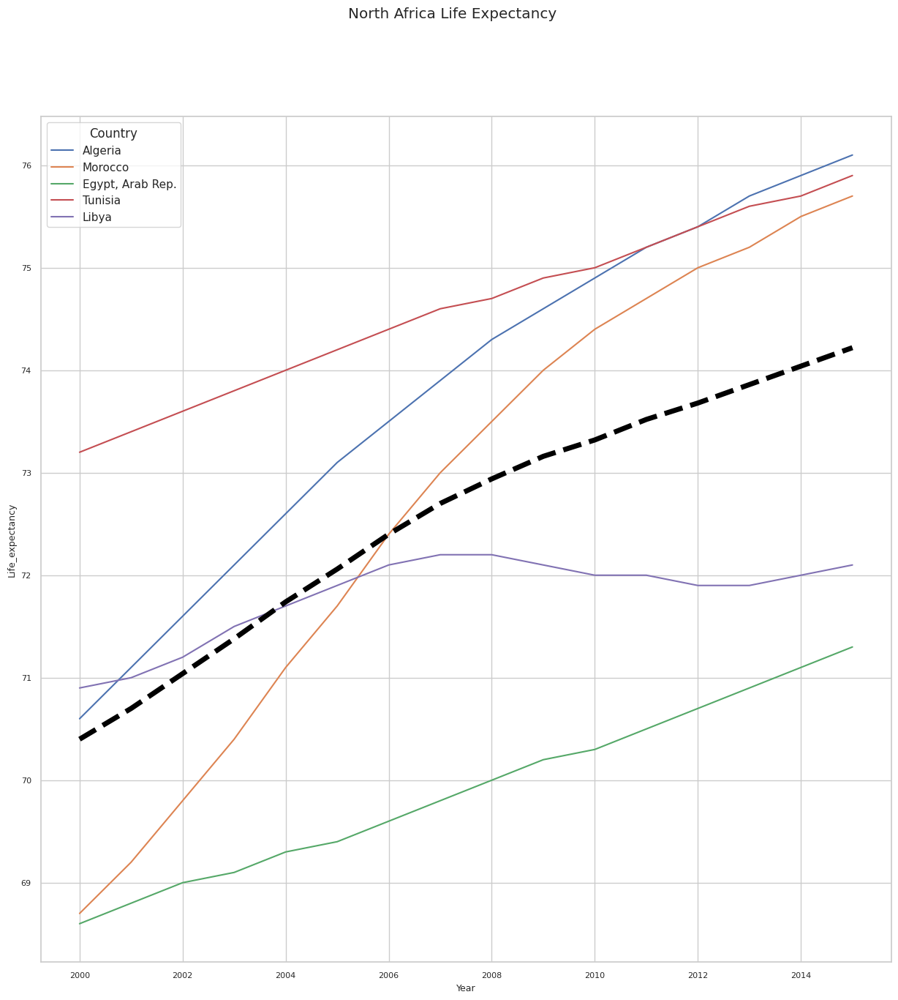

In [77]:
fig, ax = plt.subplots(figsize=(15, 15))
n = sns.lineplot(north,  x='Year', y='Life_expectancy', hue='Country')
avg_north = north.groupby('Year')['Life_expectancy'].mean()
line = lines.Line2D(avg_north.index, avg_north, linestyle='--',
                    lw=5, color='black', axes=ax)
ax.add_line(line)
fig.suptitle('North Africa Life Expectancy')

Text(0.5, 0.98, 'Southern Africa Life Expectancy')

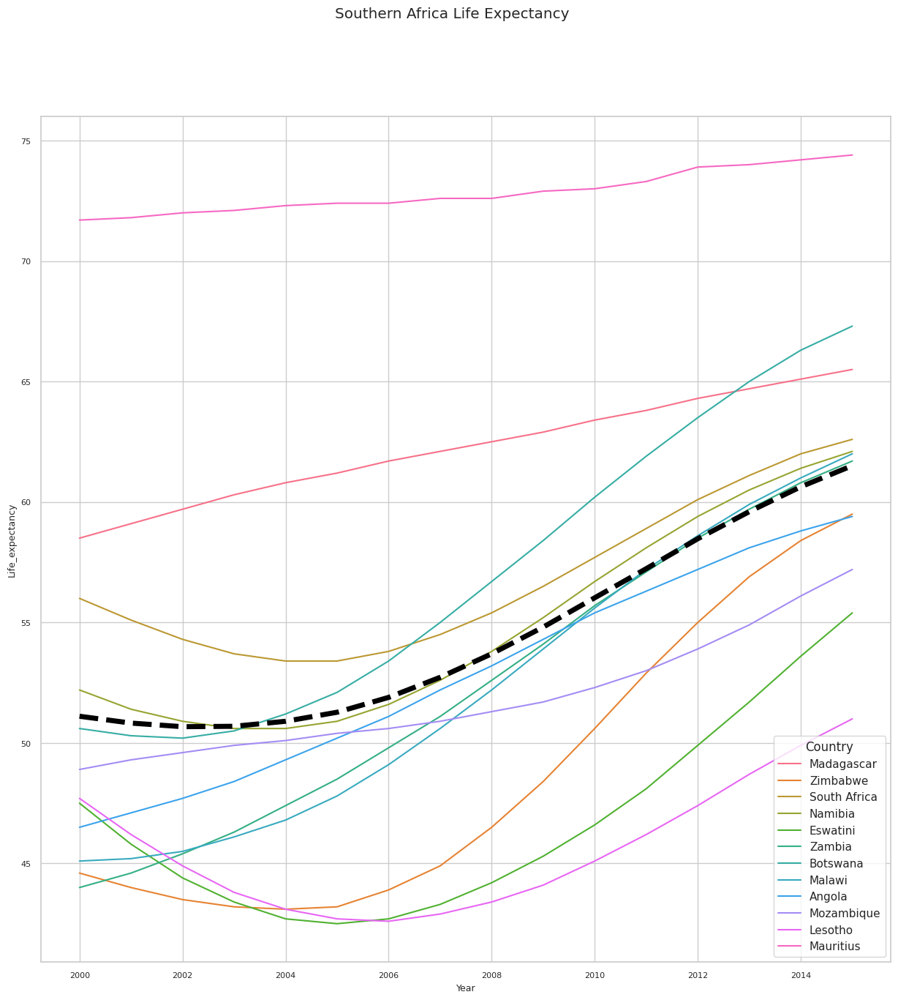

In [78]:
fig, ax = plt.subplots(figsize=(15, 15))
s = sns.lineplot(south,  x='Year', y='Life_expectancy', hue='Country')
avg_south = south.groupby('Year')['Life_expectancy'].mean()
line = lines.Line2D(avg_south.index, avg_south, linestyle='--',
                    lw=5, color='black', axes=ax)
ax.add_line(line)
fig.suptitle('Southern Africa Life Expectancy')

Text(0.5, 0.98, 'Central Africa Life Expectancy')

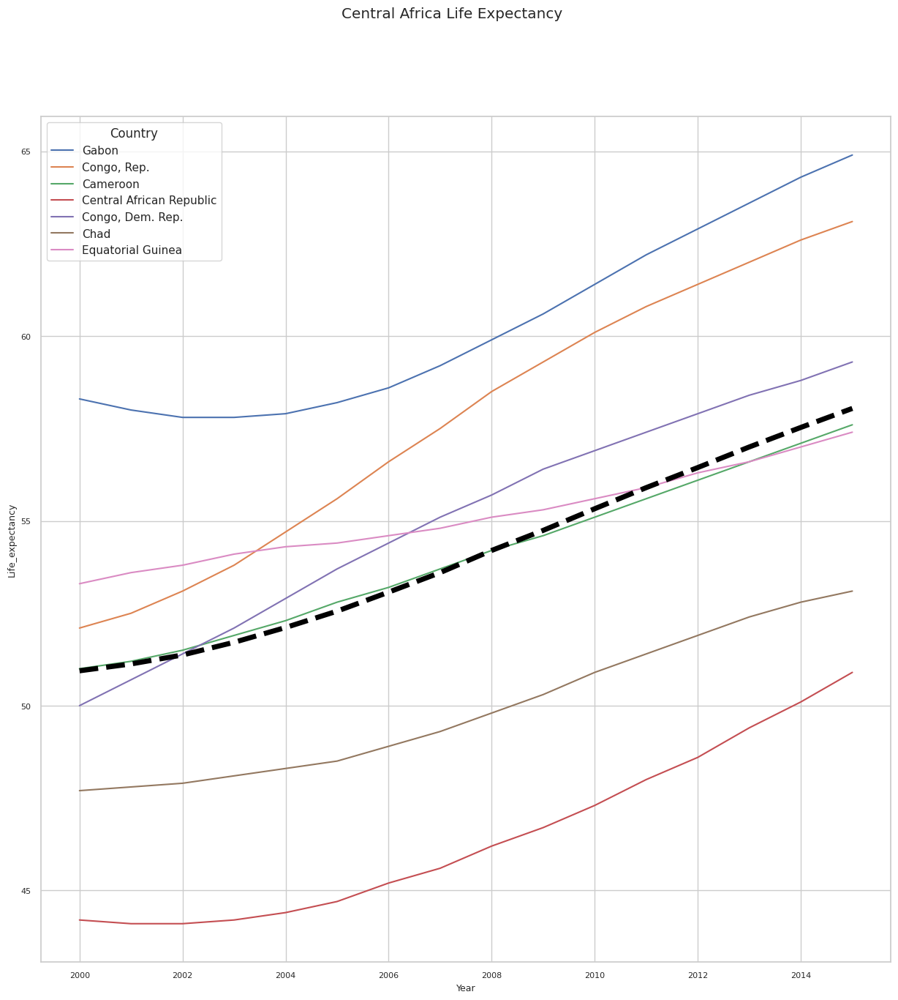

In [79]:
fig, ax = plt.subplots(figsize=(15, 15))
c = sns.lineplot(central,  x='Year', y='Life_expectancy', hue='Country')
avg_central = central.groupby('Year')['Life_expectancy'].mean()
line = lines.Line2D(avg_central.index, avg_central, linestyle='--',
                    lw=5, color='black', axes=ax)
ax.add_line(line)
fig.suptitle('Central Africa Life Expectancy')

###  1.2 Analysis of Variable Relationships

Examine the associations between `Life_expectancy` and the remaining variables in the dataset using appropriate visualization techniques such as scatter plots, box plots, or other relevant methods. As a preliminary step, subset the dataset to include only observations from the year 2008. Identify and describe the patterns that emerge, highlighting any variables that exhibit a particularly strong or consistent relationship with life expectancy. Provide an academic discussion on the potential underlying factors—whether socioeconomic, demographic, or health-related—that might explain these observed relationships.

In [4]:

oh_eight = africa.loc[africa['Year']==2008]

oh_eight = oh_eight.drop(['Year','Economy_status_Developed','Economy_status_Developing'], axis=1)

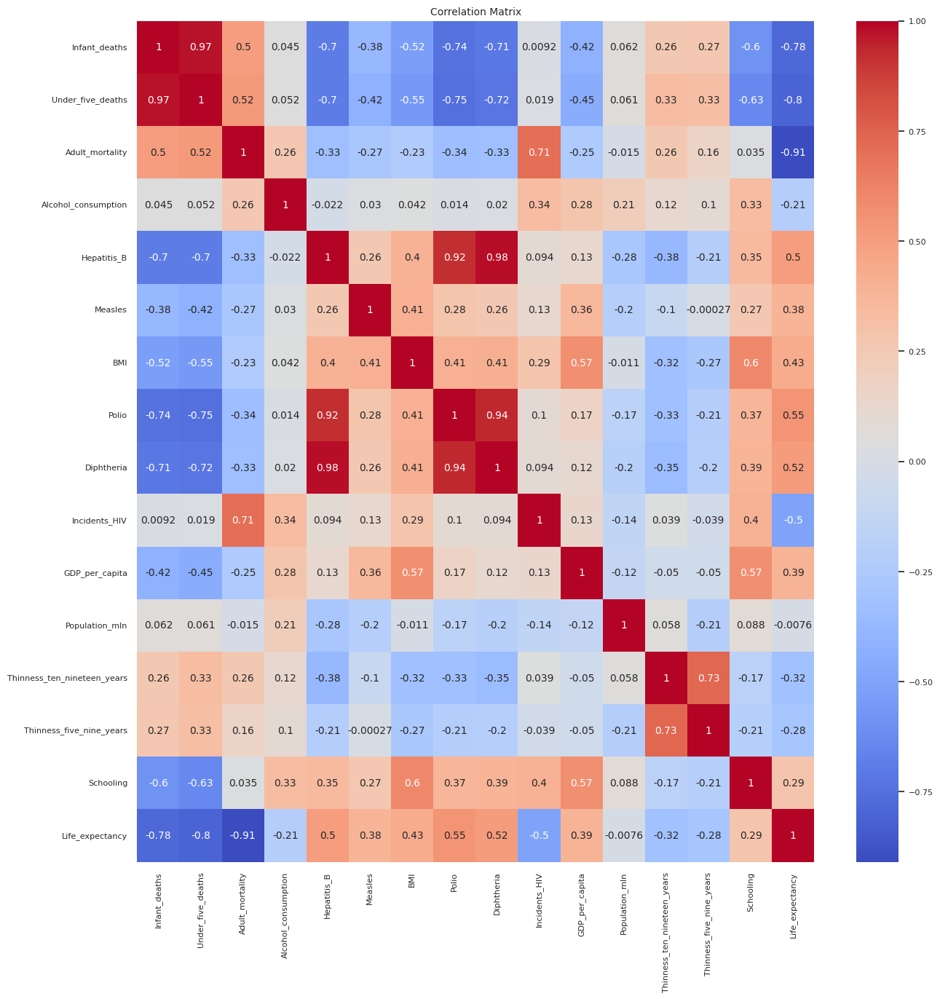

In [7]:
# Analyse correlation
df_corr = oh_eight.corr(numeric_only=True)
fig, ax = plt.subplots(figsize=(15, 15))
sns.heatmap(df_corr, annot=True, cmap='coolwarm',annot_kws={'size':10},ax=ax)
plt.title('Correlation Matrix')
# change the fontsize of the annot
plt.show()

The approach will be to look at what correlates with life expectancy and then view the relationship between those variables. We will then see if there are regional variations.

Using |0.3|-|0.5| as weak correlation and |0.5|-|0.7| as moderate correlation and >=|0.7| as strong correlation.

Life expectancy has an insignificant correlation with:
- Alcohol consumption
- Population size
- Thinness levels at five years of age
- Schooling

There is a weak correlation with:
- Measles vaccination rates
- BMI
- GDP per capita
- Thinness at ten to nineteen

There is a moderate correlation with:
- Incidents of HIV
- HepB vaccination levels
- Polio vaccination levels
- Diptheria vaccination levels

There is a strong correlation with:
- Adult mortality
- Under five deaths
- Infant mortality

Data that does not have a strong linear relationship could be missed, so it is best to visualise each piece of data separately.

<Axes: xlabel='Life_expectancy', ylabel='Count'>

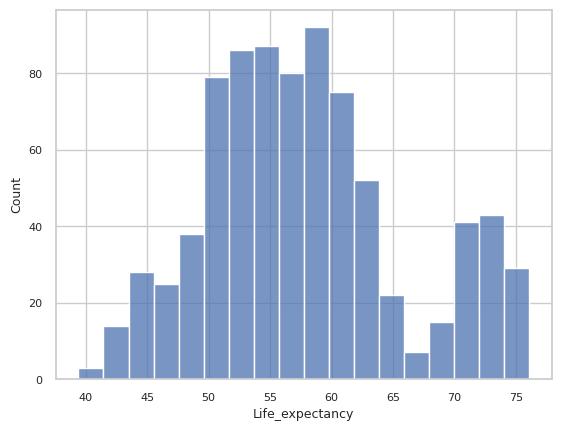

In [30]:
sns.histplot(data=africa, x='Life_expectancy', multiple='stack')

In [39]:
for column in africa.columns:
  print(africa[column])

AttributeError: 'DataFrame' object has no attribute 'column'

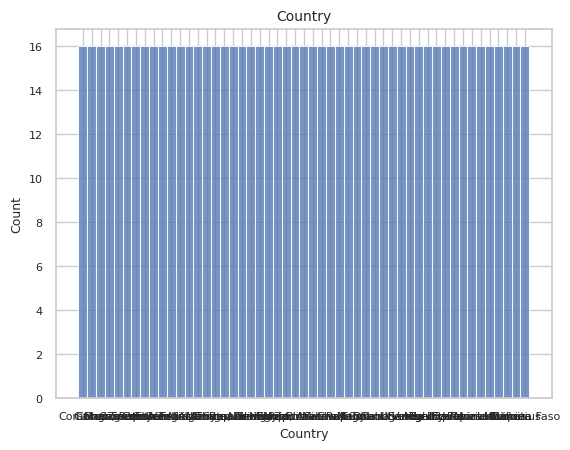

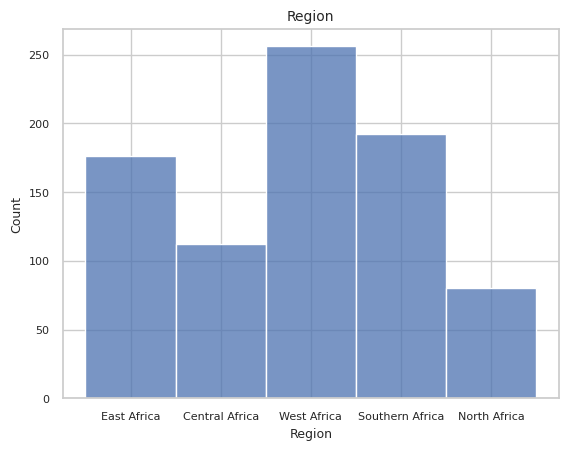

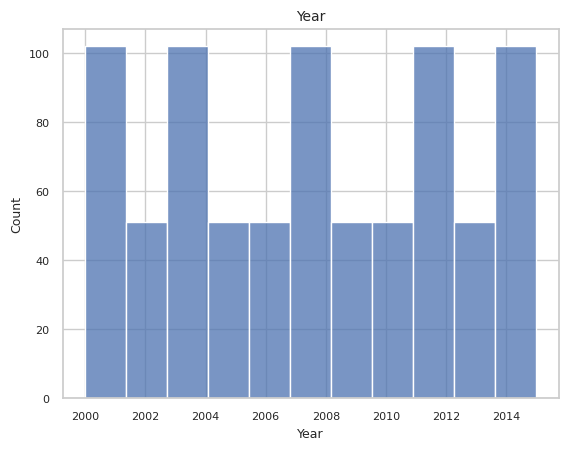

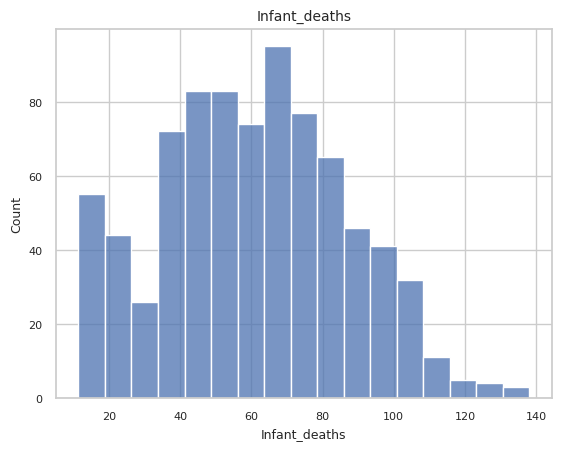

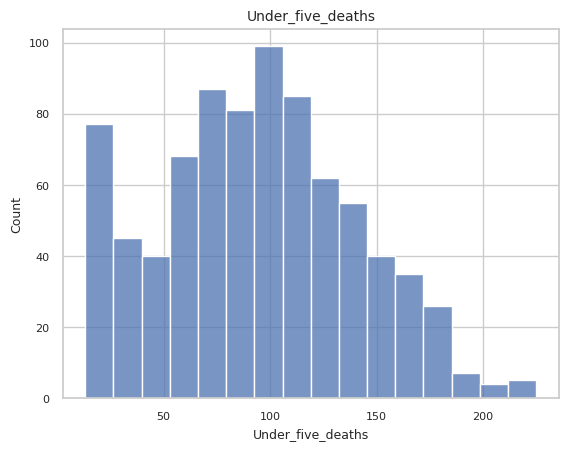

...

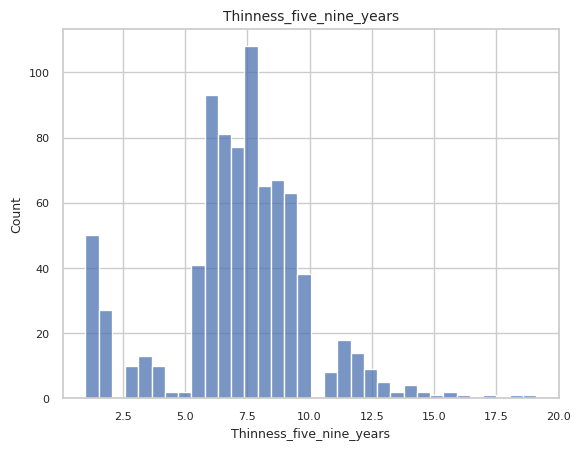

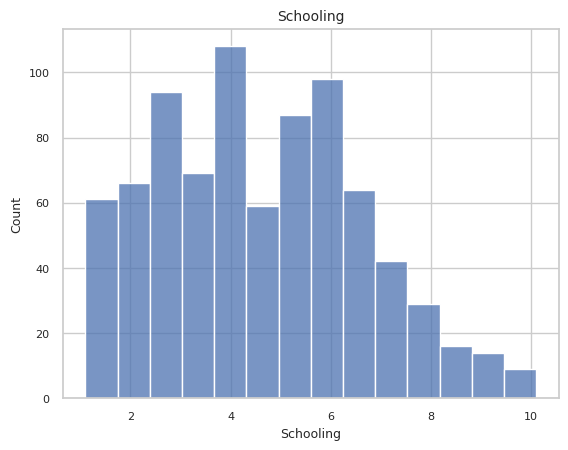

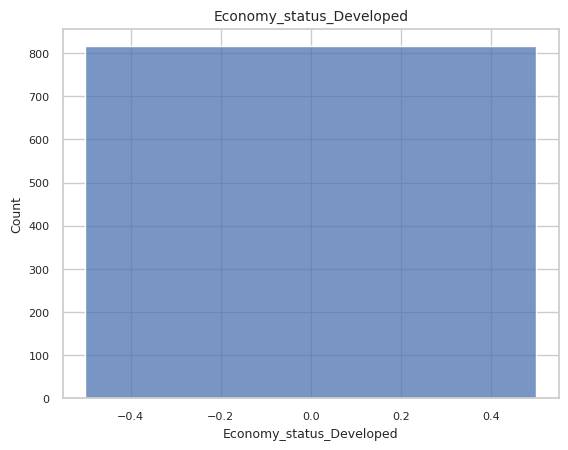

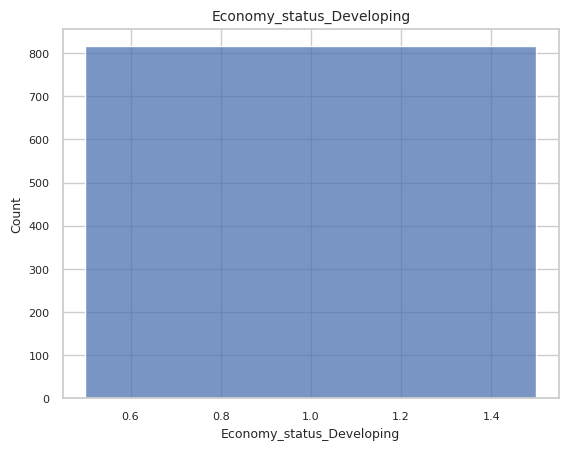

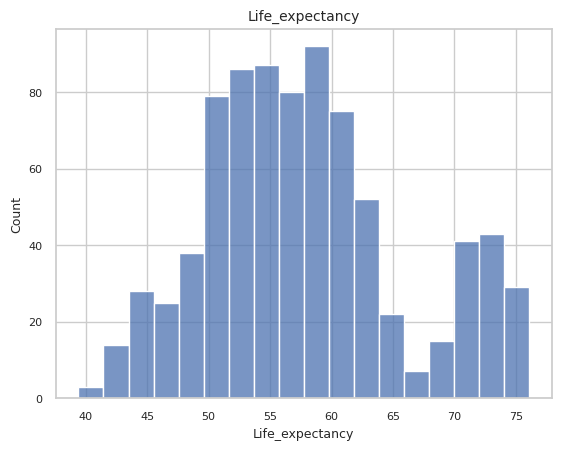

In [42]:
for column in africa.columns:
    if column != 'Life_expectancy' or 'Year' or 'Country':
        sns.histplot(data=africa, x=africa[column], multiple='stack')
        plt.title(f'{column}')
        plt.show()

-- Region vs Infant Deaths, U5 deaths, Adult Mortality, incidents hiv, thinness ten nineteen, five nine (box plot)

-- Infant deaths vs U5 (linear), adult mortality (clusters), hep b (semi circle), bmi (boomerang), polio (semi circle), diptheria (semicircle), gdp (semi-circle), schooling (rough semi circle), life expectancy (broken line)

-- Adult mortality vs incidents hiv (semi circle), gdp(semi circle), life expectancy (broken line)

-- Alcohol consumption vs hep b, polio, diptheria (semi circle), thinness ten nineteen, five nine (hyperbolic)

-- hep b vs bmi (semi circle), polio, diptheria (line), thinness (boomerang)

-- bmi vs gdp (semi circle), population (parabola), thinness , schooling(line)

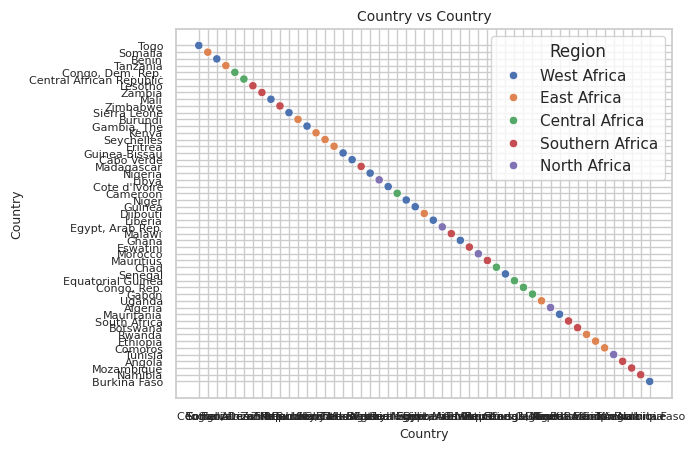

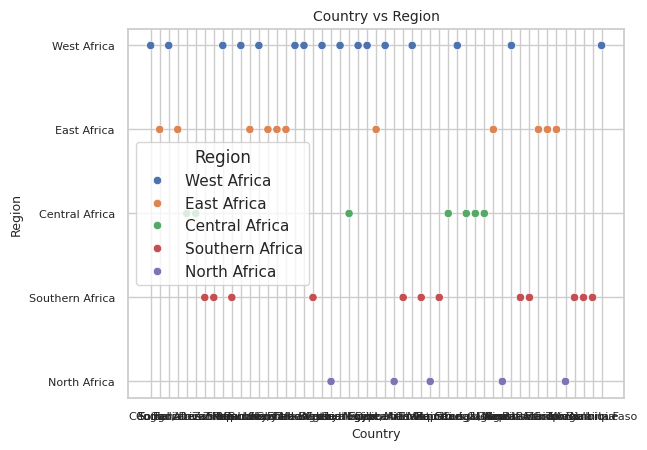

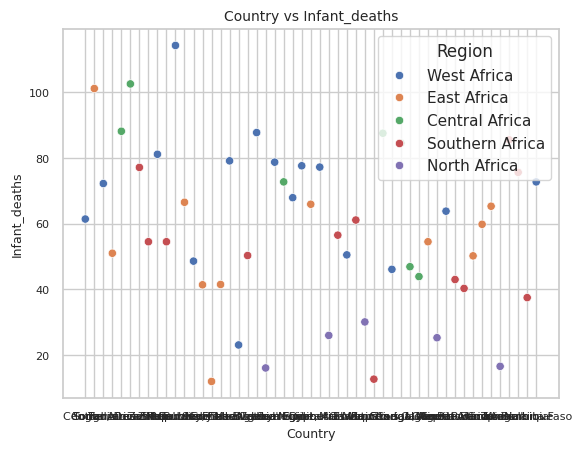

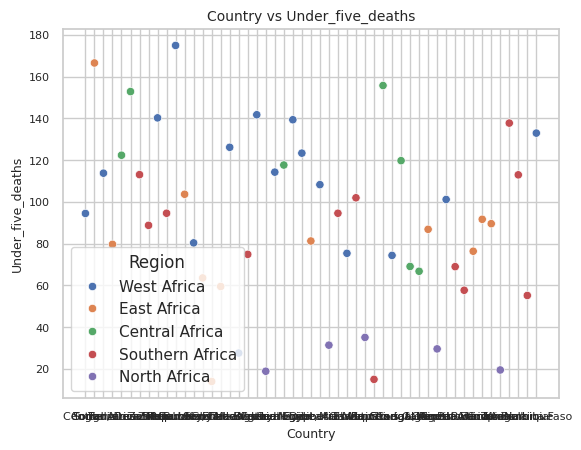

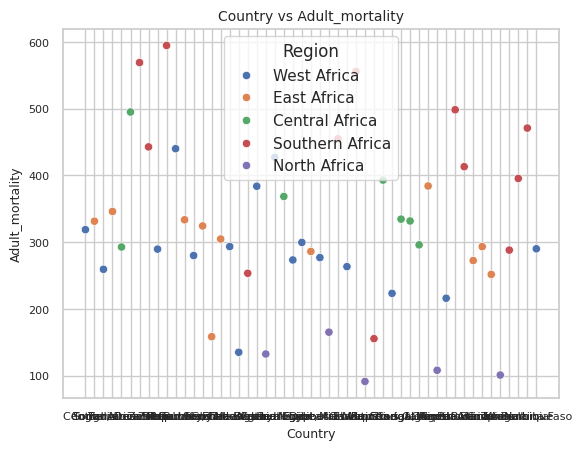

...

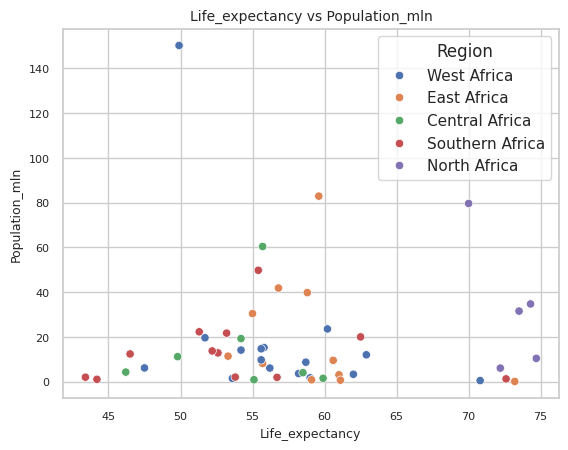

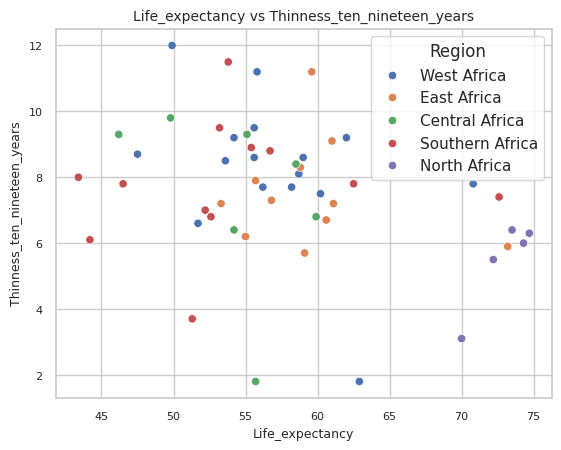

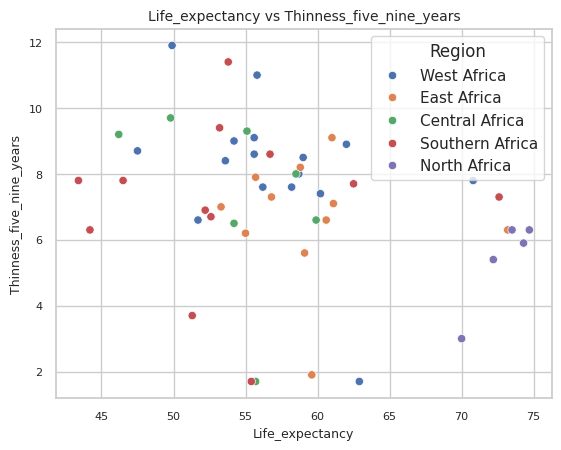

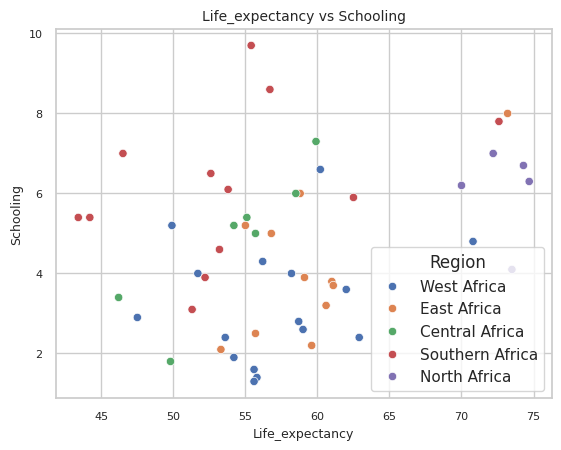

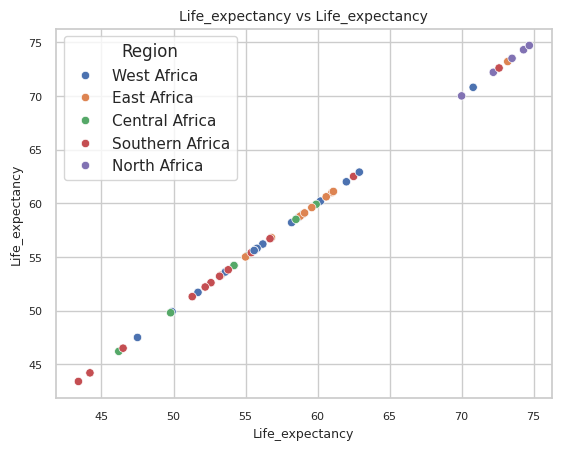

In [5]:
for col1 in oh_eight.columns:
    for col2 in oh_eight.columns:
        sns.scatterplot(data=oh_eight, x=oh_eight[col1], y=oh_eight[col2], hue='Region')
        plt.title(f'{col1} vs {col2}')
        plt.show()

In [34]:
africa['log_Alcohol_consumption'] = np.log(africa['Alcohol_consumption'])
africa['log_GDP_per_capita'] = np.log(africa['GDP_per_capita'])
africa['log_Population_mln'] = np.log(africa['Population_mln'])
africa['log_Schooling'] = np.log(africa['Schooling'])
africa['log_Incidents_HIV'] = np.log(africa['Incidents_HIV'])

/usr/local/lib/python3.11/dist-packages/pandas/core/arraylike.py:399: RuntimeWarning: divide by zero encountered in log
  result = getattr(ufunc, method)(*inputs, **kwargs)


<Axes: xlabel='log2_Alcohol_consumption', ylabel='Count'>

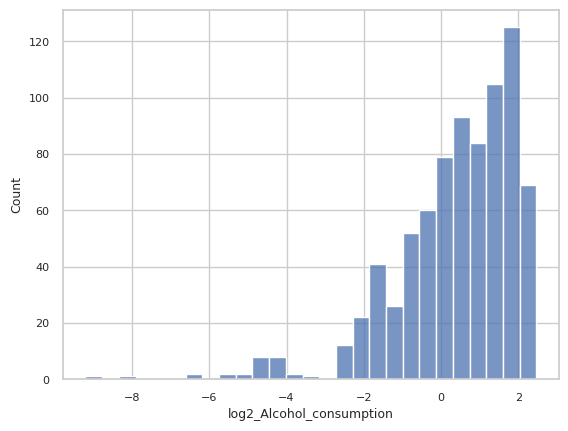

In [47]:
# after log transformation due to right skew
sns.histplot(data=africa, x=africa['log2_Alcohol_consumption'], multiple='stack')


In [17]:
africa['cbrt_Alcohol_consumption'] = np.cbrt(africa['Alcohol_consumption'])

<Axes: xlabel='cbrt_Alcohol_consumption', ylabel='Count'>

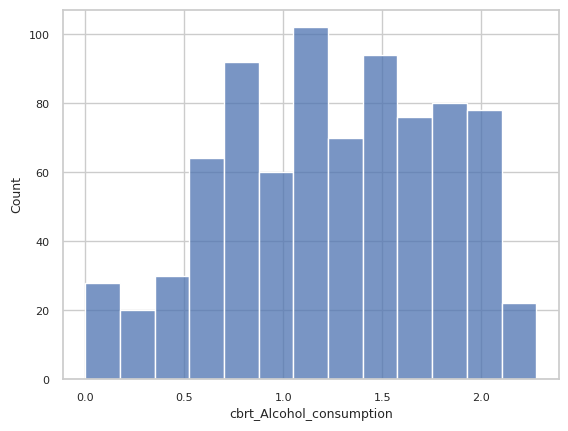

In [18]:
sns.histplot(data=africa, x=africa['cbrt_Alcohol_consumption'], multiple='stack')

<Axes: xlabel='sqrt_Alcohol_consumption', ylabel='Life_expectancy'>

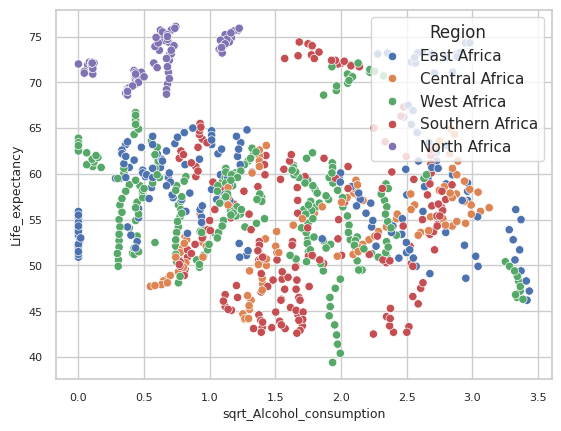

In [15]:
sns.scatterplot(data=africa, x='sqrt_Alcohol_consumption', y='Life_expectancy', hue='Region')

In [16]:
np.corrcoef(africa.sqrt_Alcohol_consumption, africa.Life_expectancy)

array([[ 1.        , -0.19975868],
       [-0.19975868,  1.        ]])

[[ 1.         -0.04320647]
 [-0.04320647  1.        ]]


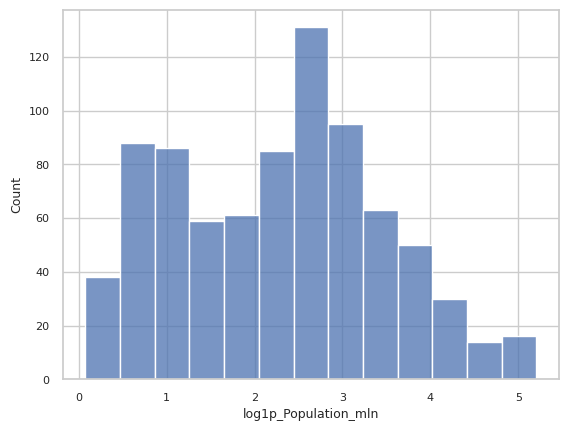

In [37]:
africa['log1p_Population_mln'] = np.log1p(africa['Population_mln'])
sns.histplot(data=africa, x=africa['log1p_Population_mln'], multiple='stack')
print(np.corrcoef(africa.log1p_Population_mln, africa.Life_expectancy))

In [6]:
from sklearn.preprocessing import StandardScaler

In [7]:
X = africa.drop(['Life_expectancy','Year','Country','Region'], axis=1)
y = africa.Life_expectancy

In [8]:
std = StandardScaler()
X_std = std.fit_transform(X)

/usr/local/lib/python3.11/dist-packages/sklearn/preprocessing/_function_transformer.py:387: RuntimeWarning: invalid value encountered in log1p
  return func(X, **(kw_args if kw_args else {}))


<Axes: xlabel='Alcohol_consumption', ylabel='Count'>

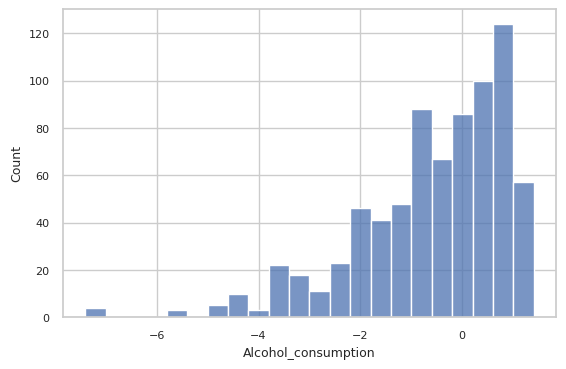

In [27]:
from sklearn.preprocessing import FunctionTransformer, PowerTransformer
trf = FunctionTransformer(func = np.log1p)
africa_transformed = pd.DataFrame(trf.fit_transform(X=X_std,y=y),columns=X.columns )
plt.figure(figsize=(14,4))
plt.subplot(121)
sns.histplot(data=africa_transformed, x=africa_transformed['Alcohol_consumption'], multiple='stack')

In [29]:
np.corrcoef(africa_transformed.Alcohol_consumption, africa_transformed.Life_expectancy)

AttributeError: 'DataFrame' object has no attribute 'Life_expectancy'

<Axes: xlabel='Alcohol_consumption', ylabel='Count'>

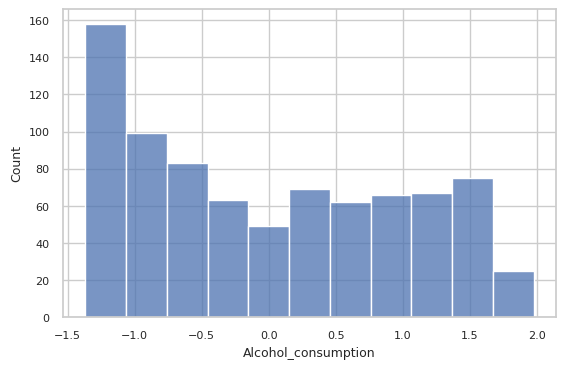

In [25]:
pt = PowerTransformer(method="yeo-johnson")

pt.fit(X_std)

africa_transformed = pd.DataFrame(pt.transform(X_std + 0.00001)  , columns=X.columns)

# pd.DataFrame({'cols':xtrain.columns,'box_cox_lambdas':pt.lambdas_})

plt.figure(figsize=(14,4))
plt.subplot(121)
sns.histplot(data=africa_transformed, x=africa_transformed['Alcohol_consumption'], multiple='stack')


In [49]:
X.max()

,0
Infant_deaths,138.100000
Under_five_deaths,224.900000
Adult_mortality,719.360500
Alcohol_consumption,11.800000
Hepatitis_B,99.000000
Measles,99.000000
BMI,29.500000
Polio,99.000000
Diphtheria,99.000000
Incidents_HIV,21.680000


In [47]:
pt = PowerTransformer(method="box-cox")

pt.fit(X.astype(float) + 0.001)

XTrf  = pd.DataFrame(pt.transform(X.astype(float)+ 0.001)  , columns=["Alcohol_consumption","GDP_per_capita"])

plt.figure(figsize=(14,4))
plt.subplot(121)
sns.distplot(XTrf['Alcohol_consumption'])
plt.title("Fare before transform")

ValueError: Input X contains infinity or a value too large for dtype('float64').

### 1.3 Variable Selection, Actionability, and Statistical Considerations

Based on your exploratory data analysis, identify the variables you propose to include in your Bayesian linear model for inferring the effects of health indicators on life expectancy. In your discussion, please address both statistical and practical aspects by considering the following questions:

- Which variables appear most influential and relevant according to your analyses, and what underlying mechanisms might justify their inclusion?
- Reflect on the concept of actionability: To what extent can interventions realistically improve these variables? Consider whether a variable represents a direct target for policy change (for example, immunization rates) versus a more distal or structural factor (such as overall GDP per capita).
- How do potential issues like multicollinearity influence your variable selection? Discuss whether highly correlated variables should be combined, represented by a single measure, or treated separately, and explain your reasoning.

Your answer should integrate these considerations to justify a well-rounded and contextually informed model specification.

## 2. Bayesian Linear Regression

Subset the data to 2008 and the variables you have chosen based on your EDA and reasoning. Implement a Bayesian linear regression model to infer the effects of the chosen health indicators on life expectancy.

### 2.1 Mathematical Expression of the Model
Write down the mathematical expression of the model.

### 2.2 Implement the Model in Stan and infer the posterior using MCMC
Implement the Bayesian linear regression model in Stan. Compile the model and sample from the posterior using MCMC.
You will not be judged on the efficiency of the Stan code, but rather on the correctness of the model implementation.

### 2.3 Diagnose the Model
Conduct model diagnostics to ensure that the sampler did not encounter any issues during the sampling process. Check for convergence, effective sample size, and goodness of fit.

### 2.4 Summarize and Visualise the Results
Summarise the posterior distribution of the model parameters and provide point estimates and 95% credible intervals for the effects of the chosen health indicators on life expectancy.

### 2.6 Interpret the Results
Interpret the results of the Bayesian linear regression model in the context of the research question. Discuss the magnitude and direction of the effects of the chosen health indicators on life expectancy.

## Recommendations

Your government is interested in improving life expectancy. They inform you that they have a limited budget and can only focus on a few health indicators. Based on your analysis, what recommendations would you give to the government? What are the potential benefits of focusing on these health indicators? Provide evidence to support your recommendations.

The government has been able to provide you with the latest statistics on each of the indicators. They want you to use this information to:

1. Predict the life expectancy, which has not been measured yet.
2. Visualize the life expectancy predictions by changing the values of each health indicator you have chose by 10%. Note that for some indicators a increase in value is good for life expectancy, while for others a decrease is good.

In [ ]:
new_data_dict = {
    'Adult_mortality': 263.6,
    'Alcohol_consumption': 3.0,
    'BMI': 23.8,
    'Diphtheria': 80.9,
    'Economy_status_Developed': 0.0,
    'Economy_status_Developing': 1.0,
    'GDP_per_capita': 2705,
    'Hepatitis_B': 81.5,
    'Incidents_HIV': 1.8,
    'Infant_deaths': 47.6,
    'Measles': 69.5,
    'Polio': 81.1,
    'Population_mln': 22.1,
    'Schooling': 5.3,
    'Thinness_five_nine_years': 6.6,
    'Thinness_ten_nineteen_years': 6.7,
    'Under_five_deaths': 68.8
}

## Extending the linear model

So far we have only worked with data from a single year. How would you improve/reformulate the model to include data from all years? and/or account for non linearity in the relationship between the health indicators and life expectancy? Implement your ideas, summarise the results, and provide a discussion. You will be assessed based on the following criteria:

- The ability to provide a clear mathematical expression of the model and justify the modeling choices.
- The ability to correctly implement the model in Stan.
- The ability to extract estimates from the model to create figures and tables that answer the research question.

Note: If you choose to do a longitudinal analysis, you may need to subset the data to a smaller number of countries as an analysis of all countries may be computationally intensive.